# Тематическое моделирование коротких текстовых сообщений

В работе мы применим методы тематического моделирования с помощью BERTopic.

Тематическое моделирование — это метод, который позволяет пользователям анализировать большие объемы текстовых данных без необходимости читать их по отдельности. Другими словами, это модель коллекции текстовых документов, которая определяет, к каким темам относится каждый документ коллекции. Алгоритм построения тематической модели получает на входе коллекцию текстовых документов. На выходе для каждого документа выдаётся числовой вектор, составленный из оценок степени принадлежности данного документа каждой из тем. Размерность этого вектора, равная числу тем, может либо задаваться на входе, либо определяться моделью автоматически.

### Задача построения тематической модели

В работе [Дэвида Блея «Введение в тематическое моделирование»](http://videolectures.net/mlss09uk_blei_tm/) рассмотрен наиболее популярный алгоритм Латентное размещение Дирихле (LDA). На практике исследователи используют метод максимального правдоподобия, метод моментов, метод сингулярного разложения (SVD), алгоритм, основанный на неотрицательной матрице факторизации (NMF), вероятностные тематические модели, вероятностный латентно-семантический анализ, латентное размещение Дирихле. В работе [Воронцова К. В.](http://www.machinelearning.ru/wiki/images/d/d5/Voron17survey-artm.pdf) рассмотрены вариации основных алгоритмов тематического моделирования: робастная тематическая модель, тематические модели классификации, динамические тематические модели, иерархические тематические модели, многоязычные тематические модели, модели текста как последовательности слов, многомодальные тематические модели . Вероятностные тематические модели основаны на следующих предположениях :
 
- Порядок документов в коллекции не имеет значения  
- Порядок слов в документе не имеет значения, документ — мешок слов  
- Слова, встречающиеся часто в большинстве документов, не важны для определения тематики  
- Коллекцию документов можно представить как выборку пар документ-слово $(d,w) , d∈D, w∈Wd$  
- Каждая тема $t∈T$ описывается неизвестным распределением $p(W|t)$ на множестве слов $w∈W$  
- Каждый документ $d∈D$ описывается неизвестным распределением $p(t|d)$ на множестве тем $t∈T$  
- Гипотеза условной независимости $p(w|t,d)=p(w|t)$
- Построить тематическую модель — значит, найти матрицы $Φ=||p(w|t)||$ и $Θ=||p(t|d)||$ по коллекции $D$ В более сложных вероятностных - тематических моделях некоторые из этих предположений заменяются более реалистичными.

Подробнее про методы вероятностный латентно-семантический анализ (PLSA) и латентное размещение Дирихле (LDA) можно прочитать в [книге Воронцова К. В.](http://www.machinelearning.ru/wiki/images/d/d5/Voron17survey-artm.pdf). 

Хотя тематические модели, такие LDA, хорошо работают, но для создания осмысленных тем требуется приложить немало усилий с помощью настройки гиперпараметров и применение более сложных моделей, основаннных на трансформерах, такие как BERT, поскольку они показали потрясающие результаты в различных задачах NLP за последние несколько лет. Предварительно обученные модели особенно полезны, поскольку они должны содержать более точные представления слов и предложений.


Также мы хотим не просто смотреть на сгенерированные темы, мы хотим понять отношения тем, как они развивались с течением времени и как мы можем улучшить представления тем. Истинная сила тематического моделирования заключается в том, чтобы выйти за рамки простого создания тем и их использования, чтобы по-настоящему понять отношения и закономерности в данных.

В этой работе была взята модель [BERTopic](https://github.com/MaartenGr/BERTopic). 

BERTopic — это метод моделирования тем, который использует трансформеры и c-TF-IDF для создания плотных кластеров, позволяющих легко интерпретировать темы, сохраняя при этом важные слова в описаниях тем.

Про работу этой модели можно почитать в [посте на Medium](https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6) и также [в статье](https://arxiv.org/abs/2203.05794).

## Проведение исследования

Загрузим нужные библиотеки

In [25]:
!pip install wordcloud
#!pip install flair
#!pip install bertopic

from bertopic import BERTopic

import numpy as np
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

Наш датасет `data.csv` является подвыборкой [датасета](https://www.kaggle.com/datasets/1b6883fb66c5e7f67c697c2547022cc04c9ee98c3742f9a4d6c671b4f4eda591?resource=download), который содержит объекты, которые сооответсвуют году от 2010 до 2021. Ноутбук, который содержит код извлечения нашего датасета, можно найти [здесь](https://disk.yandex.ru/d/ViPOoTDYtoL2HA).

In [26]:
df = pd.read_csv("data/data_1.csv")
df

,id,title,category,authors,authors parsed,abstract,year
0,0704.0304,The World as Evolving Information,Information Theory,Carlos Gershenson,"[['Gershenson', 'Carlos', '']]",This paper discusses the benefits of describ...,2012
1,0704.0498,A unified analysis of the reactor neutrino pro...,High Energy Physics - Experiment,"Guillaume Mention (DAPNIA), Thierry Lasserre (...","[['Mention', 'Guillaume', '', 'DAPNIA'], ['Las...",We present in this article a detailed quanti...,2013
2,0704.2768,Heat Equations and the Weighted $\bar\partial$...,Analysis of PDEs,Andrew Raich,"[['Raich', 'Andrew', '']]",The purpose of this article is to establish ...,2012
3,0704.3930,The KATRIN sensitivity to the neutrino mass an...,High Energy Physics - Phenomenology,"J. Bonn, K. Eitel, F. Gl\""uck, D. Sevilla-Sanc...","[['Bonn', 'J.', ''], ['Eitel', 'K.', ''], ['Gl...",The aim of the KArlsruhe TRItium Neutrino ex...,2011
4,0705.0477,"Penguin-mediated B_(d,s)->VV decays and the Bs...",High Energy Physics - Phenomenology,"Sebastien Descotes-Genon (Orsay, LPT), Joaquim...","[['Descotes-Genon', 'Sebastien', '', 'Orsay, L...","In this letter, we propose three different s...",2011
...,...,...,...,...,...,...,...
49786,quant-ph/0608026,Search via Quantum Walk,Quantum Physics,"Fr\'ed\'eric Magniez, Ashwin Nayak, J\'er\'emi...","[['Magniez', 'Frédéric', ''], ['Nayak', 'Ashwi...",We propose a new method for designing quantu...,2011
49787,quant-ph/0702236,The Maslov correction in the semiclassical Fey...,Quantum Physics,P. A. Horvathy,"[['Horvathy', 'P. A.', '']]",The Maslov correction to the wave function i...,2011
49788,quant-ph/9508004,Alternative Derivation of the Hu-Paz-Zhang Mas...,Quantum Physics,J.J.Halliwell and T.Yu,"[['Halliwell', 'J. J.', ''], ['Yu', 'T.', '']]","Hu, Paz and Zhang [ B.L. Hu, J.P. Paz and Y....",2019
49789,quant-ph/9809076,Guiding Neutral Atoms with a Wire,Quantum Physics,"Johannes Denschlag, Donatella Cassettari, Joer...","[['Denschlag', 'Johannes', ''], ['Cassettari',...",We demonstrate guiding of cold neutral atoms...,2017


Создадим нашу модель BERTopic. Затем, преобразовав наши описания каждого текста в нужный формат, найдём наши темы и вероятности.

In [27]:
model = BERTopic(calculate_probabilities=True, verbose=True)
 
#convert to list 
docs = df.abstract.to_list()
 
topics, probabilities = model.fit_transform(docs)

Batches:   0%|          | 0/1556 [00:00<?, ?it/s]

2022-07-10 10:01:06,546 - BERTopic - Transformed documents to Embeddings
2022-07-10 10:01:48,845 - BERTopic - Reduced dimensionality
2022-07-10 10:12:03,147 - BERTopic - Clustered reduced embeddings


Сохраним нашу модель.

In [28]:
model.save("bert_model")

Для визуализации облаков слов, будем использовать функцию `create_wordcloud`.

In [29]:
def create_wordcloud(topic_model, topic):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Визуализируем облака слов первых 20 тем.

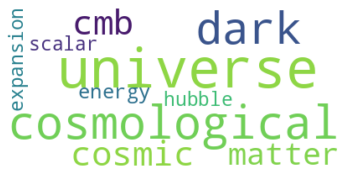

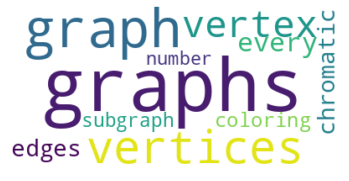

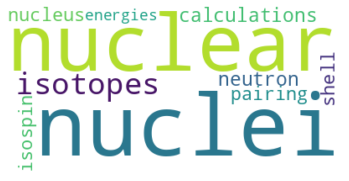

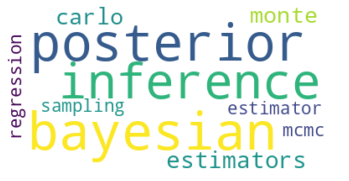

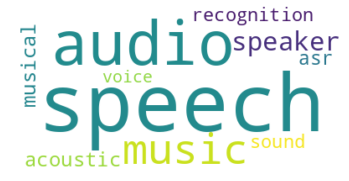

...

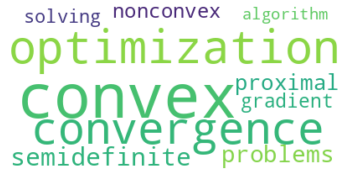

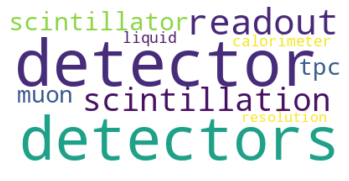

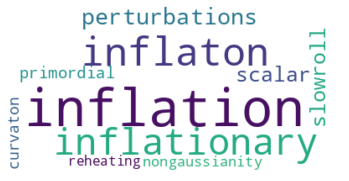

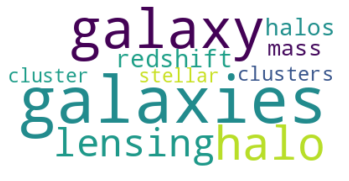

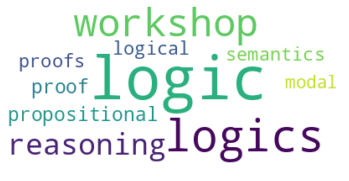

In [30]:
for i in range(20):
    create_wordcloud(model, topic=i)

Всего у нас 573 темы, давайте посмотрим на первые 20 тем:

In [38]:
freq_bert = model.get_topic_info(); 
freq_bert.head(20)

,Topic,Count,Name
0,-1,22800,-1_of_the_in_to
1,0,537,0_universe_cosmological_dark_cmb
2,1,447,1_graphs_graph_vertices_vertex
3,2,444,2_nuclei_nuclear_isotopes_calculations
4,3,354,3_bayesian_posterior_inference_estimators
5,4,353,4_speech_audio_music_speaker
6,5,316,5_polymer_contact_friction_droplets
7,6,310,6_mimo_channel_relay_power
8,7,284,7_sentiment_social_media_twitter
9,8,279,8_qcd_quark_lattice_chiral


Далее давайте взглянем на наиболее часто создаваемую тему:

In [32]:
model.get_topic(0)

[('universe', 0.016172557795078327),
 ('cosmological', 0.015525007001531373),
 ('dark', 0.014449284428182227),
 ('cmb', 0.00800937570806709),
 ('cosmic', 0.007996123857091092),
 ('matter', 0.007656557575137443),
 ('energy', 0.006770429002143056),
 ('expansion', 0.005992754997743927),
 ('hubble', 0.00593670919025662),
 ('scalar', 0.005735054694570328)]

Мы можем создать обзор наиболее частых тем таким образом, чтобы их было легко интерпретировать. Горизонтальные гистограммы 
обычно довольно хорошо передают информацию и обеспечивают интуитивное представление тем:

In [33]:
model.visualize_barchart(top_n_topics=12)

Для каждой темы мы создали 10 слов, которые лучше всего представляют эту тему. Однако достаточно ли 10 слов? 
Можем ли мы уже иметь хорошее представление темы с помощью 1 слова?

Чтобы понять количество слов, необходимое для достаточного представления темы, мы можем показать снижение оценки термина при 
добавлении терминов. Идея заключается в том, что каждый добавленный термин имеет более низкую оценку термина, чем предыдущий, 
поскольку первый термин является лучшим для темы. В конце концов, мы достигаем точки убывающей отдачи, которая очень похожа 
на метод локтя (elbow-method), используемый в k-NN. Ниже вы можете увидеть снижение оценки термина при добавлении терминов в тему:

In [34]:
model.visualize_term_rank()

In [35]:
model.visualize_term_rank(log_scale=True)

Используя метод локтя, кажется, что 5 слов на тему достаточно для хорошего представления темы. Любые слова, которые мы добавляем после этого, кажутся малоэффективными.

Извлекая темы и их представления, может быть полезно проверить уникальность каждой темы. Некоторые темы могут быть очень 
похожими и могут быть объединены или просто интересны для дальнейшего изучения.

Для этого мы начинаем с сопоставления наших тем с 2D-представлением, уменьшая векторы тем с помощью UMAP:

In [39]:
model.visualize_topics()

Расстояние между темами в определенной степени показывает сходство между темами. Однако, чтобы лучше визуализировать и понять сходство между темами, мы можем использовать два графика, чтобы лучше понять это: иерархия тем и ее матрицу подобия:

In [43]:
model.visualize_hierarchy(top_n_topics=30, width=1000)

In [41]:
model.visualize_heatmap(top_n_topics=30, n_clusters=20)

Хотя извлечение тем и их представление представляет интерес, нам не хватает некоторой размерной информации. Например, некоторые темы могут больше не быть актуальными, а некоторые набирают популярность в последние годы. Это может быть важной информацией при принятии решений.

Здесь мы будем моделировать темы на протяжении многих лет. Для каждой темы и временного шага мы вычисляем представление c-TF-IDF. Это приведет к представлению конкретной темы на каждом временном шаге без необходимости создавать кластеры из вложений, поскольку они уже были созданы. 

In [44]:
topics_over_time = model.topics_over_time(docs, topics, df.year)

11it [00:59,  5.41s/it]


In [45]:
model.visualize_topics_over_time(topics_over_time, top_n_topics=20, width=900, height=500)

Из визуализации выше мы можем увидеть появление некоторых интересных закономерностей. А именно, примерно в 2012 году многие темы, кажется, становятся все менее и менее частыми. Например, темы 0 и 2 кажутся популярными до 2012 года, после чего их популярность значительно снизилась. В последние же годы ниболее популярны темы 4 и 10.

Рассмотрим категории для каждой статьи. Можем ли мы узнать, какие темы часто встречаются в определенных категориях? Как правило, тематическое моделирование имеет тенденцию находить больше тем, чем категории, которые были определены ранее. Это помогает нам находить и понимать определенные подкатегории, которые могут существовать в данных.

In [46]:
topics_per_class = model.topics_per_class(docs, topics, classes=df.category)

148it [00:44,  3.36it/s]


In [47]:
model.visualize_topics_per_class(topics_per_class, top_n_topics=20, width=900)